## About the Data

*Kaggle dataset: https://www.kaggle.com/datasets/madhuraatmarambhagat/crop-recommendation-dataset*

"This dataset is designed to predict the most suitable crop to grow based on several agro-climatic parameters. It is commonly used in precision agriculture and machine learning applications to support farmers, agricultural advisors, and policymakers."

**Features (Inputs):**

- **N**: Nitrogen content in the soil (mg/kg)
- **P**: Phosphorus content in the soil (mg/kg)
- **K**: Potassium content in the soil (mg/kg)
- **temperature**: Average temperature (°C)
- **humidity**: Average relative humidity (%)
- **ph**: Soil pH value
- **rainfall**: Rainfall (mm)

**Label (Output):**

- **label**: The crop most suited to the given conditions (e.g., rice, maize, cotton, etc.)

## Data Cleaning

In [1]:
import pandas as pd
import numpy as np

raw = pd.read_csv("crops.csv")

raw.head(), raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2200 entries, 0 to 2199
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   N            2200 non-null   int64  
 1   P            2200 non-null   int64  
 2   K            2200 non-null   int64  
 3   temperature  2200 non-null   float64
 4   humidity     2200 non-null   float64
 5   ph           2200 non-null   float64
 6   rainfall     2200 non-null   float64
 7   label        2200 non-null   object 
dtypes: float64(4), int64(3), object(1)
memory usage: 137.6+ KB


(    N   P   K  temperature   humidity        ph    rainfall label
 0  90  42  43    20.879744  82.002744  6.502985  202.935536  rice
 1  85  58  41    21.770462  80.319644  7.038096  226.655537  rice
 2  60  55  44    23.004459  82.320763  7.840207  263.964248  rice
 3  74  35  40    26.491096  80.158363  6.980401  242.864034  rice
 4  78  42  42    20.130175  81.604873  7.628473  262.717340  rice,
 None)

In [2]:
raw.describe()

,N,P,K,temperature,humidity,ph,rainfall
count,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000
mean,50.551818,53.362727,48.149091,25.616244,71.481779,6.469480,103.463655
std,36.917334,32.985883,50.647931,5.063749,22.263812,0.773938,54.958389
min,0.000000,5.000000,5.000000,8.825675,14.258040,3.504752,20.211267
25%,21.000000,28.000000,20.000000,22.769375,60.261953,5.971693,64.551686
50%,37.000000,51.000000,32.000000,25.598693,80.473146,6.425045,94.867624
75%,84.250000,68.000000,49.000000,28.561654,89.948771,6.923643,124.267508
max,140.000000,145.000000,205.000000,43.675493,99.981876,9.935091,298.560117


In [3]:
raw['label'].value_counts()

label
rice           100
maize          100
chickpea       100
kidneybeans    100
pigeonpeas     100
mothbeans      100
mungbean       100
blackgram      100
lentil         100
pomegranate    100
banana         100
mango          100
grapes         100
watermelon     100
muskmelon      100
apple          100
orange         100
papaya         100
coconut        100
cotton         100
jute           100
coffee         100
Name: count, dtype: int64

In [4]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
raw['label_code'] = encoder.fit_transform(raw['label'])
raw['label_code'].sort_values().value_counts()

label_code
0     100
1     100
2     100
3     100
4     100
5     100
6     100
7     100
8     100
9     100
10    100
11    100
12    100
13    100
14    100
15    100
16    100
17    100
18    100
19    100
20    100
21    100
Name: count, dtype: int64

## Data Analyses

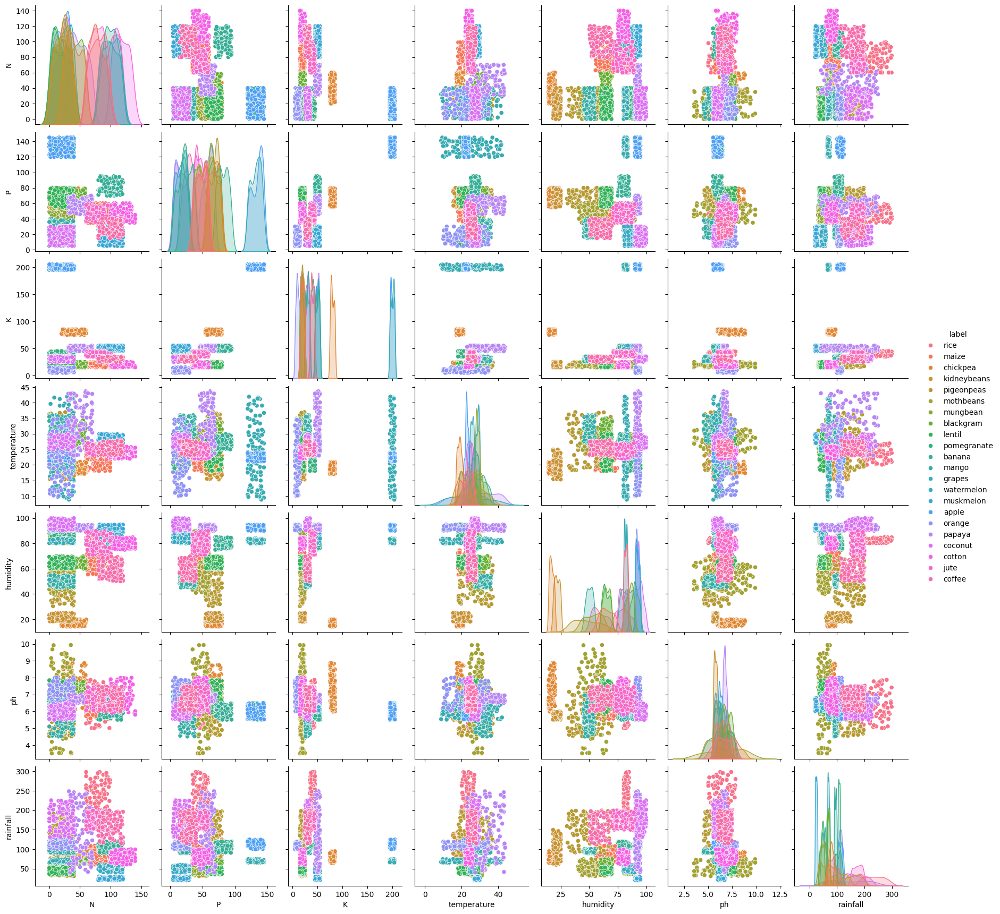

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt


sns.pairplot(raw.drop(columns="label_code"), hue="label")


<Axes: >

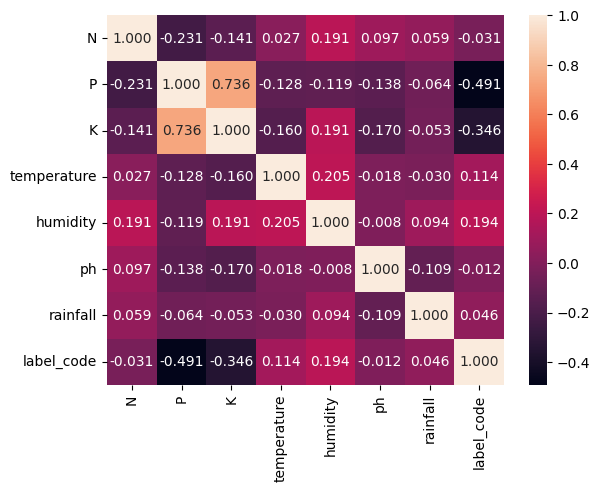

In [6]:
correlation = raw.drop(columns="label").corr()
sns.heatmap(correlation, annot=True, fmt=".3f")



Most correlative features:

- P and K
- P and Label
- K and Label

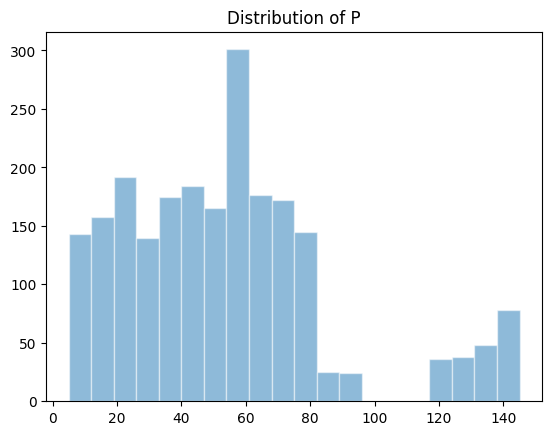

In [7]:
fig, ax = plt.subplots()
ax.hist(raw['P'], bins=20, alpha=0.5, label='P', edgecolor='white')
ax.set_title('Distribution of P')
plt.show()

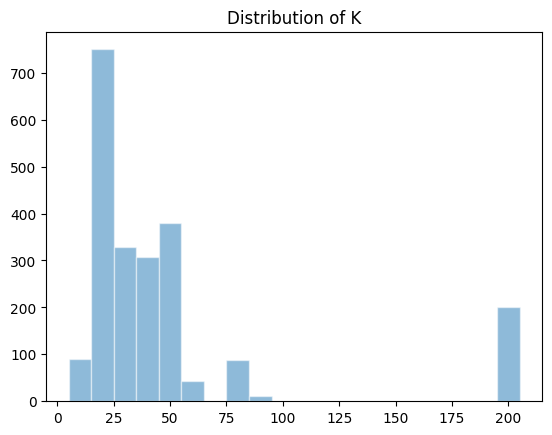

In [8]:
fig, ax = plt.subplots()
ax.hist(raw['K'], bins=20, alpha=0.5, label='K', edgecolor='white')
ax.set_title('Distribution of K')
plt.show()

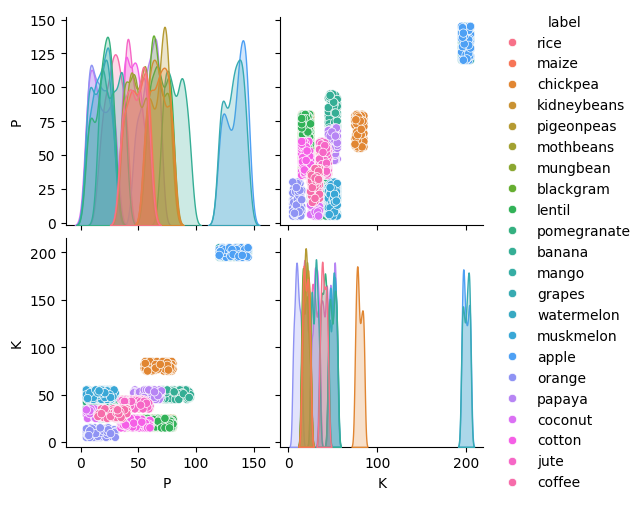

In [9]:
sns.pairplot(raw[["P", "K", "label"]], hue="label")

## Feature Creation

<Axes: >

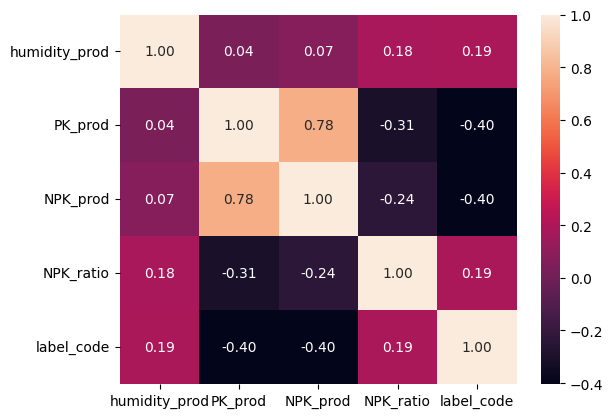

In [10]:
data = raw.drop(columns="label")

data["humidity_prod"] = data.temperature * data.humidity
data["PK_prod"] = data.P * data.K
data["NPK_prod"] = data.PK_prod * data.N
data["NPK_ratio"] = data.N / data.PK_prod

columns = ["humidity_prod", "PK_prod", "NPK_prod", "NPK_ratio", "label_code"]

correlation = data[columns].corr()
sns.heatmap(correlation, annot=True, fmt=".2f")


- **humidity_prod:**
This feature captures the combined effect of temperature and humidity. High values may indicate hot and humid conditions, which can significantly affect crop growth and disease risk.

- **PK_prod:**
This represents the interaction between phosphorus and potassium, two essential soil nutrients. It helps the model detect situations where both nutrients are present in high (or low) amounts, which can influence plant health and yield.

- **NPK_prod:**
This is the product of nitrogen, phosphorus, and potassium—the three primary macronutrients for plants. It highlights cases where all three are abundant (or deficient), which is crucial for optimal crop development.

- **NPK_ratio:**
This ratio measures the balance between nitrogen and the combined effect of phosphorus and potassium. It can help the model identify nutrient imbalances, which may affect which crops are best suited for the soil.

## Data Normalization

In [11]:
data

,N,P,K,temperature,humidity,ph,rainfall,label_code,humidity_prod,PK_prod,NPK_prod,NPK_ratio
0,90,42,43,20.879744,82.002744,6.502985,202.935536,20,1712.196283,1806,162540,0.049834
1,85,58,41,21.770462,80.319644,7.038096,226.655537,20,1748.595734,2378,202130,0.035744
2,60,55,44,23.004459,82.320763,7.840207,263.964248,20,1893.744627,2420,145200,0.024793
3,74,35,40,26.491096,80.158363,6.980401,242.864034,20,2123.482908,1400,103600,0.052857
4,78,42,42,20.130175,81.604873,7.628473,262.717340,20,1642.720357,1764,137592,0.044218
...,...,...,...,...,...,...,...,...,...,...,...,...
2195,107,34,32,26.774637,66.413269,6.780064,177.774507,5,1778.191164,1088,116416,0.098346
2196,99,15,27,27.417112,56.636362,6.086922,127.924610,5,1552.805515,405,40095,0.244444
2197,118,33,30,24.131797,67.225123,6.362608,173.322839,5,1622.263022,990,116820,0.119192
2198,117,32,34,26.272418,52.127394,6.758793,127.175293,5,1369.512711,1088,127296,0.107537


In [12]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data.drop(columns="label_code"))

normal = pd.DataFrame(data_scaled, columns=data.drop(columns="label_code").columns, index=data.index)
normal["label_code"] = data["label_code"]
normal



,N,P,K,temperature,humidity,ph,rainfall,humidity_prod,PK_prod,NPK_prod,NPK_ratio,label_code
0,0.642857,0.264286,0.190,0.345886,0.790267,0.466264,0.656458,0.382843,0.059966,0.141374,0.090023,20
1,0.607143,0.378571,0.180,0.371445,0.770633,0.549480,0.741675,0.392358,0.079226,0.175808,0.064570,20
2,0.428571,0.357143,0.195,0.406854,0.793977,0.674219,0.875710,0.430300,0.080640,0.126292,0.044788,20
3,0.528571,0.214286,0.175,0.506901,0.768751,0.540508,0.799905,0.490353,0.046296,0.090109,0.095484,20
4,0.557143,0.264286,0.185,0.324378,0.785626,0.641291,0.871231,0.364682,0.058552,0.119674,0.079877,20
...,...,...,...,...,...,...,...,...,...,...,...,...
2195,0.764286,0.207143,0.135,0.515037,0.608410,0.509353,0.566064,0.400094,0.035791,0.101256,0.177657,5
2196,0.707143,0.071429,0.110,0.533473,0.494359,0.401561,0.386972,0.341178,0.012795,0.034874,0.441577,5
2197,0.842857,0.200000,0.125,0.439202,0.617880,0.444433,0.550071,0.359334,0.032492,0.101607,0.215314,5
2198,0.835714,0.192857,0.145,0.500627,0.441760,0.506045,0.384280,0.293265,0.035791,0.110719,0.194260,5


## Random Forest

In [67]:
from sklearn.model_selection import train_test_split

def get_train_test(data, columns_drop):
    X = data.drop(columns=columns_drop, axis=1)
    Y = data["label_code"]
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
    return X_train, X_test, Y_train, Y_test

In [68]:
X_train, X_test, Y_train, Y_test = get_train_test(normal, ["label_code"])

In [69]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report



class RFModel:
    def __init__(self, x_train, x_test, y_train, y_test):
        self.x_train = x_train
        self.x_test = x_test
        self.y_train = y_train
        self.y_test = y_test
        self.model = None
        self.y_pred = None
    
    
    def configure_model(self):
        self.model = RandomForestClassifier(max_depth=5, random_state=42)
        
    def configure_model(self, params):
        self.model = RandomForestClassifier(**params)
        
    def fit_predict_model(self):
        self.model.fit(self.x_train, self.y_train)
        self.y_pred = self.model.predict(self.x_test)
    
    
    def show_report(self):
        print(classification_report(self.y_test, self.y_pred))
        
        
    

In [70]:
def get_feature_importances(model, X_train):
    importances = model.feature_importances_
    feature_names = X_train.columns
    plt.figure()
    sns.barplot(x=importances, y=feature_names)
    plt.title("Feature Importances")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

### RF1

In [71]:
rf_1 = RFModel(X_train, X_test, Y_train, Y_test)

rf_1.configure_model({"n_estimators": 100, "criterion": "gini", "max_depth": 50, "n_jobs": 5, "random_state": 42})
rf_1.fit_predict_model()

rf_1.show_report()


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00        26
           2       1.00      1.00      1.00        26
           3       1.00      1.00      1.00        34
           4       1.00      1.00      1.00        33
           5       0.97      1.00      0.98        30
           6       1.00      1.00      1.00        28
           7       1.00      1.00      1.00        23
           8       0.87      0.97      0.92        34
           9       1.00      1.00      1.00        36
          10       0.96      1.00      0.98        22
          11       1.00      1.00      1.00        26
          12       1.00      1.00      1.00        32
          13       1.00      0.97      0.99        34
          14       1.00      1.00      1.00        30
          15       1.00      1.00      1.00        24
          16       1.00      1.00      1.00        25
          17       1.00    

In [72]:
def get_confusion_matrix(model):
    plt.figure()
    matrix = confusion_matrix(model.y_test, model.y_pred)
    sns.heatmap(matrix, annot=True, cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Real')
    plt.tight_layout()
    plt.show()

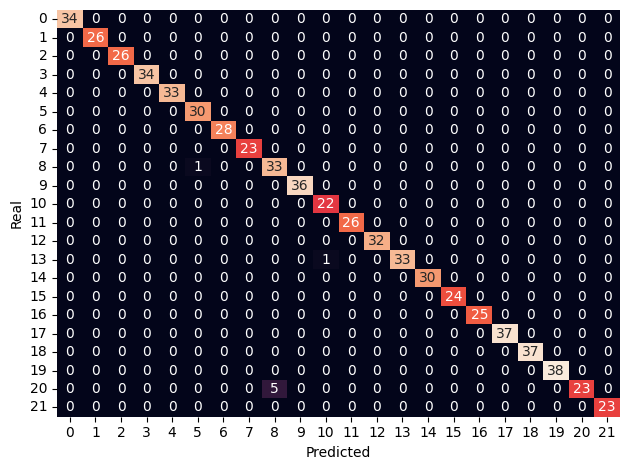

In [73]:
get_confusion_matrix(rf_1)

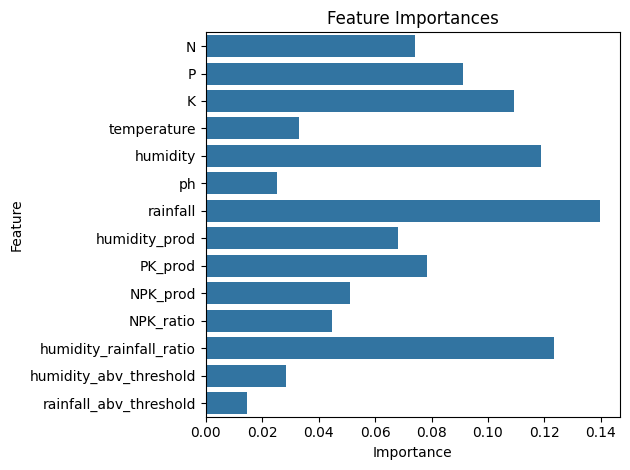

In [74]:
get_feature_importances(rf_1.model, X_train)

### RF2

In [75]:
X_train, X_test, Y_train, Y_test = get_train_test(normal, ["label_code", "ph"])

In [76]:
rf_2 = RFModel(X_train, X_test, Y_train, Y_test)

rf_2.configure_model({"n_estimators": 100, "criterion": "gini", "max_depth": 100, "n_jobs": 5, "random_state": 42})
rf_2.fit_predict_model()

rf_2.show_report()

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00        26
           2       0.96      1.00      0.98        26
           3       1.00      1.00      1.00        34
           4       1.00      1.00      1.00        33
           5       0.97      1.00      0.98        30
           6       1.00      1.00      1.00        28
           7       1.00      1.00      1.00        23
           8       0.85      0.97      0.90        34
           9       1.00      1.00      1.00        36
          10       0.95      0.95      0.95        22
          11       1.00      1.00      1.00        26
          12       1.00      1.00      1.00        32
          13       0.97      0.97      0.97        34
          14       1.00      1.00      1.00        30
          15       1.00      1.00      1.00        24
          16       1.00      1.00      1.00        25
          17       1.00    

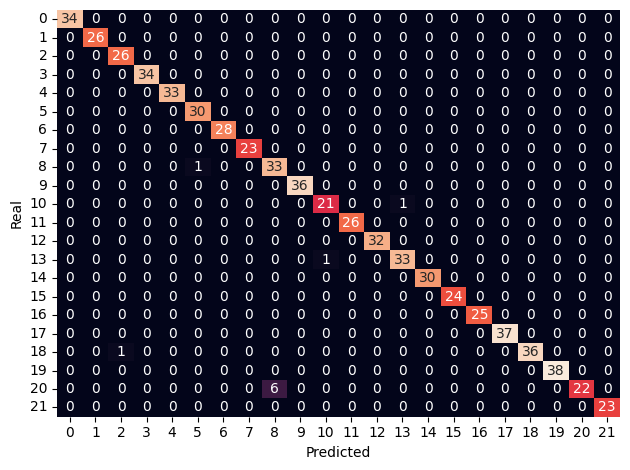

In [77]:
get_confusion_matrix(rf_2)

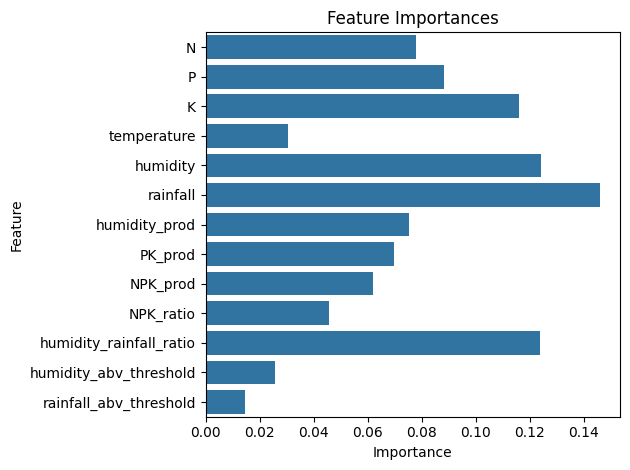

In [78]:
get_feature_importances(rf_2.model, X_train)

### Ajust Features

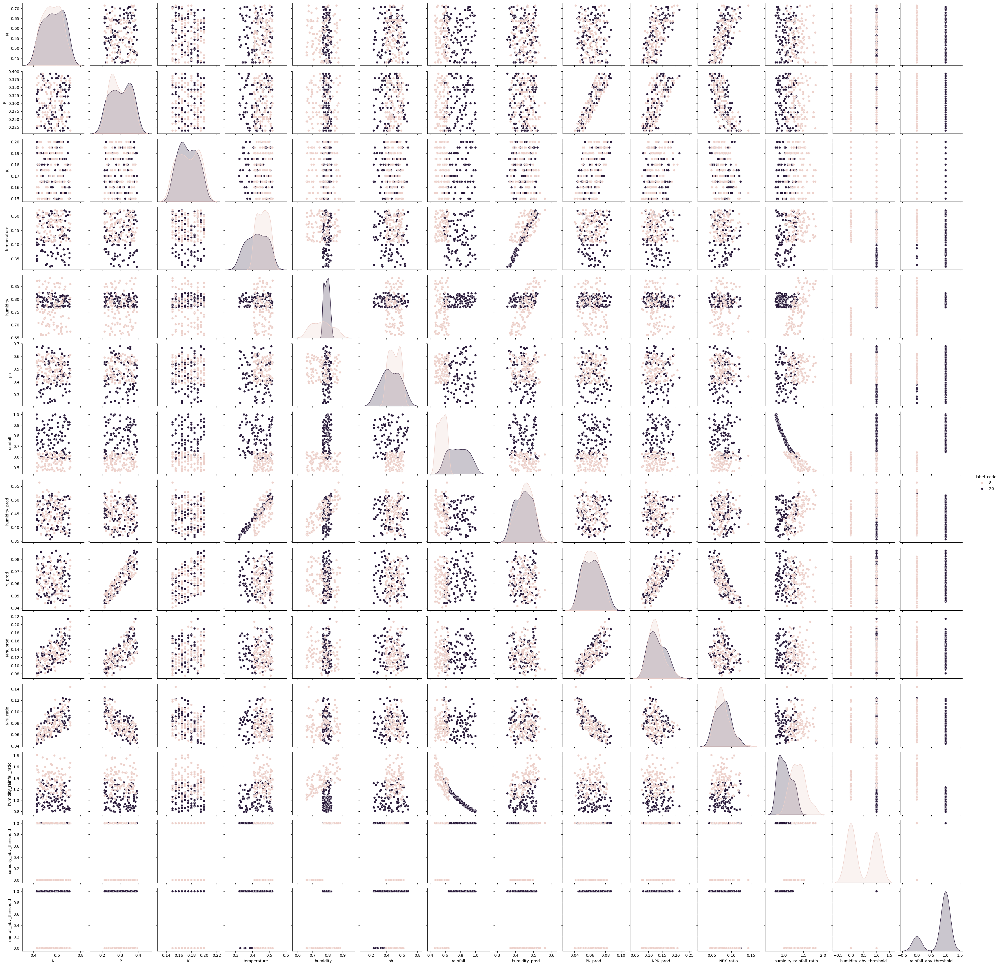

In [79]:
conflict_classes = normal[(normal["label_code"] == 20) | (normal["label_code"] == 8)]

sns.pairplot(conflict_classes, hue="label_code")

In [80]:
normal["humidity_rainfall_ratio"] = normal["humidity"] / (normal["rainfall"] + 0.01)
normal["humidity_rainfall_ratio"].describe()

count    2200.000000
mean        4.654512
std         9.239661
min         0.000000
25%         1.321346
50%         2.619990
75%         4.143890
max        90.696869
Name: humidity_rainfall_ratio, dtype: float64

### RF3

In [81]:
X_train, X_test, Y_train, Y_test = get_train_test(normal, ["label_code", "ph"])

rf_3 = RFModel(X_train, X_test, Y_train, Y_test)
rf_3.configure_model({"n_estimators": 100, "criterion": "gini", "max_depth": 100, "n_jobs": 5, "random_state": 42})
rf_3.fit_predict_model()

rf_3.show_report()


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00        26
           2       0.96      1.00      0.98        26
           3       1.00      1.00      1.00        34
           4       1.00      1.00      1.00        33
           5       0.97      1.00      0.98        30
           6       1.00      1.00      1.00        28
           7       1.00      1.00      1.00        23
           8       0.85      0.97      0.90        34
           9       1.00      1.00      1.00        36
          10       0.95      0.95      0.95        22
          11       1.00      1.00      1.00        26
          12       1.00      1.00      1.00        32
          13       0.97      0.97      0.97        34
          14       1.00      1.00      1.00        30
          15       1.00      1.00      1.00        24
          16       1.00      1.00      1.00        25
          17       1.00    

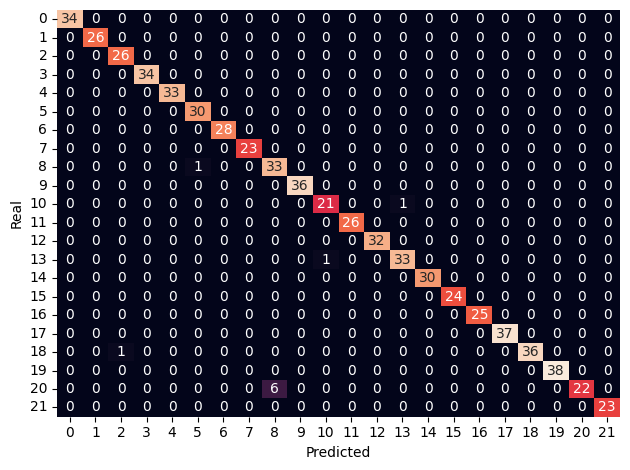

In [82]:
get_confusion_matrix(rf_3)

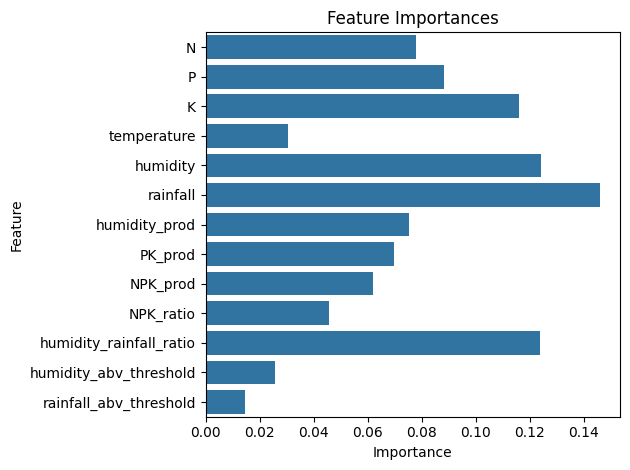

In [83]:
get_feature_importances(rf_3.model, X_train)

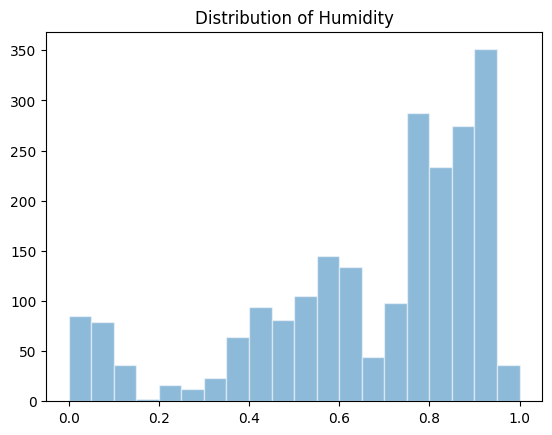

In [84]:
fig, ax = plt.subplots()
ax.hist(normal['humidity'], bins=20, alpha=0.5, label='humidity', edgecolor='white')
ax.set_title('Distribution of Humidity')
plt.show()

### Adjust Threshold

In [85]:
def set_treshold(value, data, column):
    threshold = value
    pred = (data[column] > threshold).astype(int)  # 1 se acima do threshold, 0 se abaixo
    table = pd.crosstab(pred, data["label_code"])
    print(f'{table}\n')

In [86]:
from sklearn.metrics import precision_score    

def best_threshold(data, column, positive_label):
    y_true = (data["label_code"] == positive_label).astype(int)
    thresholds = sorted(data[column].unique())
    best_thr = None
    best_score = 0

    for thr in thresholds:
        y_pred = (data[column] > thr).astype(int)
        score = precision_score(y_true, y_pred, zero_division=0)  
        if score > best_score:
            best_score = score
            best_thr = thr
    print(f"Best Threshhold {column}: {best_thr} (prec={best_score:.2f})\n")
    return best_thr



In [87]:
hum_threshold = best_threshold(conflict_classes, "humidity", positive_label=20)
set_treshold(hum_threshold, conflict_classes, "humidity")

Best Threshhold humidity: 0.7663384219848994 (prec=0.68)

label_code  8    20
humidity           
0           54    0
1           46  100



In [88]:

rain_threshold = best_threshold(conflict_classes, "rainfall", positive_label=20)
set_treshold(rain_threshold, conflict_classes, "rainfall")



Best Threshhold rainfall: 0.6453233911713318 (prec=1.00)

label_code   8   20
rainfall           
0           100  20
1             0  80



In [89]:
normal["humidity_abv_threshold"] = (normal["humidity"] > hum_threshold).astype(int)
normal["rainfall_abv_threshold"] = (normal["rainfall"] > rain_threshold).astype(int)

### RF4

In [127]:
X_train, X_test, Y_train, Y_test = get_train_test(normal, ["label_code"])

rf_4 = RFModel(X_train, X_test, Y_train, Y_test)
rf_4.configure_model({"n_estimators": 100, "criterion": "gini", "max_depth": 100, "n_jobs": 5, "random_state": 42})
rf_4.fit_predict_model()
rf_4.show_report()

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00        26
           2       1.00      1.00      1.00        26
           3       1.00      1.00      1.00        34
           4       1.00      1.00      1.00        33
           5       0.97      1.00      0.98        30
           6       1.00      1.00      1.00        28
           7       1.00      1.00      1.00        23
           8       0.87      0.97      0.92        34
           9       1.00      1.00      1.00        36
          10       0.96      1.00      0.98        22
          11       1.00      1.00      1.00        26
          12       1.00      1.00      1.00        32
          13       1.00      0.97      0.99        34
          14       1.00      1.00      1.00        30
          15       1.00      1.00      1.00        24
          16       1.00      1.00      1.00        25
          17       1.00    

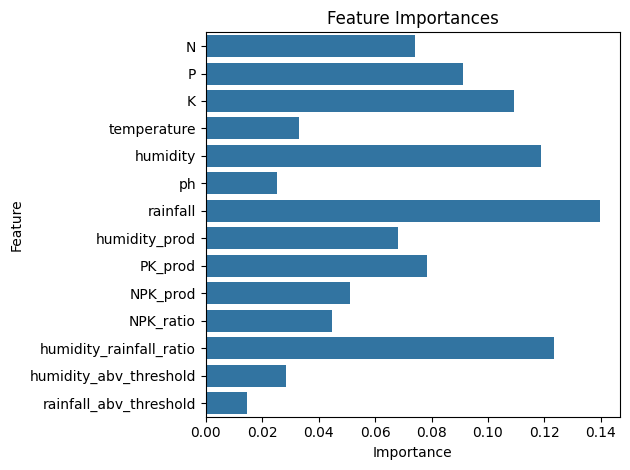

In [91]:
get_feature_importances(rf_4.model, X_train)

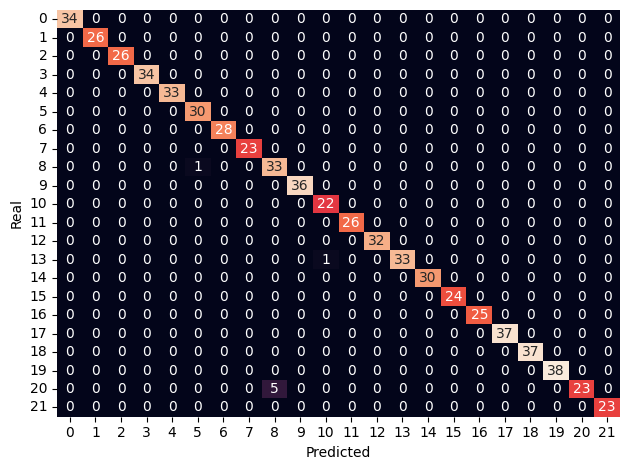

In [92]:
get_confusion_matrix(rf_4)

## KNN

In [109]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_score

class KNN:
    def __init__(self, x_train, x_test, y_train, y_test):
        self.x_train = x_train
        self.x_test = x_test
        self.y_train = y_train
        self.y_test = y_test
        self.model = None
        self.y_pred = None
    
    
    def configure_model(self, params):
        self.model = KNeighborsClassifier(**params)
        
    def fit_predict_model(self):
        self.model.fit(self.x_train, self.y_train)
        self.y_pred = self.model.predict(self.x_test)
    
    def get_accuracy(self):
        return self.model.score(self.x_test, self.y_test)
    def get_precision(self):
        return precision_score(self.y_test, self.y_pred, zero_division=0, average='weighted')
    
    def show_report(self):
        print(classification_report(self.y_test, self.y_pred))

### KNN1

In [110]:
normal.head()

,N,P,K,temperature,humidity,ph,rainfall,humidity_prod,PK_prod,NPK_prod,NPK_ratio,label_code,humidity_rainfall_ratio,humidity_abv_threshold,rainfall_abv_threshold
0,0.642857,0.264286,0.190,0.345886,0.790267,0.466264,0.656458,0.382843,0.059966,0.141374,0.090023,20,1.185772,1,1
1,0.607143,0.378571,0.180,0.371445,0.770633,0.549480,0.741675,0.392358,0.079226,0.175808,0.064570,20,1.025221,1,1
2,0.428571,0.357143,0.195,0.406854,0.793977,0.674219,0.875710,0.430300,0.080640,0.126292,0.044788,20,0.896429,1,1
3,0.528571,0.214286,0.175,0.506901,0.768751,0.540508,0.799905,0.490353,0.046296,0.090109,0.095484,20,0.949187,1,1
4,0.557143,0.264286,0.185,0.324378,0.785626,0.641291,0.871231,0.364682,0.058552,0.119674,0.079877,20,0.891509,1,1


In [93]:
normal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2200 entries, 0 to 2199
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   N                        2200 non-null   float64
 1   P                        2200 non-null   float64
 2   K                        2200 non-null   float64
 3   temperature              2200 non-null   float64
 4   humidity                 2200 non-null   float64
 5   ph                       2200 non-null   float64
 6   rainfall                 2200 non-null   float64
 7   humidity_prod            2200 non-null   float64
 8   PK_prod                  2200 non-null   float64
 9   NPK_prod                 2200 non-null   float64
 10  NPK_ratio                2200 non-null   float64
 11  label_code               2200 non-null   int64  
 12  humidity_rainfall_ratio  2200 non-null   float64
 13  humidity_abv_threshold   2200 non-null   int64  
 14  rainfall_abv_threshold  

In [ ]:
def compare_K(X_train, X_test, Y_train, Y_test, params):
    scores = []	
    precision_scores = []

    for k in range(1, 100):
        knn_base = KNN(X_train, X_test, Y_train, Y_test)
        knn_base.configure_model({"n_neighbors": k, **params})
        knn_base.fit_predict_model()
        scores.append(knn_base.get_accuracy())
        precision_scores.append(knn_base.get_precision())

    plt.figure(figsize=(10, 6))
    plt.plot(range(1, 100), scores, label='Accuracy')
    plt.plot(range(1, 100), precision_scores, label='Precision (weighted)')
    plt.xlabel('K')
    plt.ylabel('Score')
    plt.legend()
    plt.grid(True)
    plt.show()

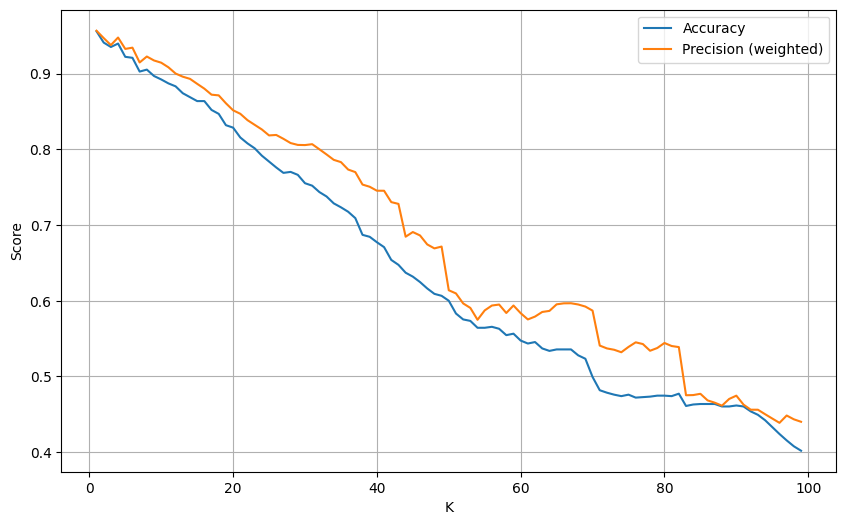

In [153]:
X_test, X_train, Y_test, Y_train = get_train_test(normal, ["label_code"])
compare_K(X_train, X_test, Y_train, Y_test, {"n_jobs": 5})

In [ ]:
knn1 = KNN(X_train, X_test, Y_train, Y_test)
knn1.configure_model({"n_neighbors": 5, "weights": "distance", "algorithm": "auto", "n_jobs": 20})
knn1.fit_predict_model()
knn1.show_report()


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        66
           1       1.00      1.00      1.00        74
           2       0.91      1.00      0.95        74
           3       1.00      1.00      1.00        66
           4       0.99      1.00      0.99        67
           5       1.00      1.00      1.00        70
           6       0.97      0.90      0.94        72
           7       1.00      1.00      1.00        77
           8       0.92      0.88      0.90        66
           9       0.98      1.00      0.99        64
          10       0.76      0.95      0.85        78
          11       0.89      0.97      0.93        74
          12       0.96      1.00      0.98        68
          13       0.94      0.48      0.64        66
          14       0.83      1.00      0.91        70
          15       1.00      1.00      1.00        76
          16       1.00      0.83      0.91        75
          17       1.00    

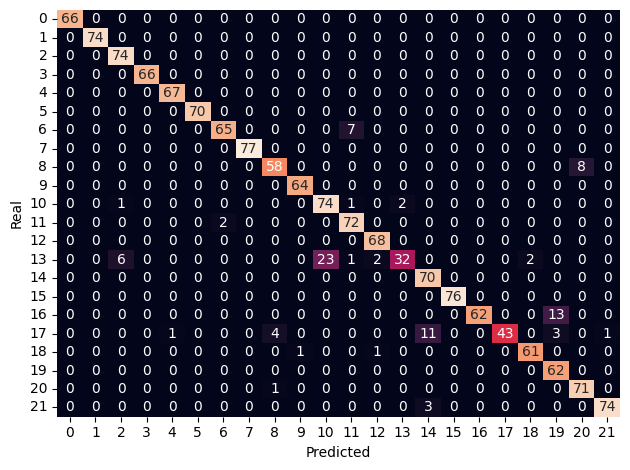

In [142]:
get_confusion_matrix(knn1)

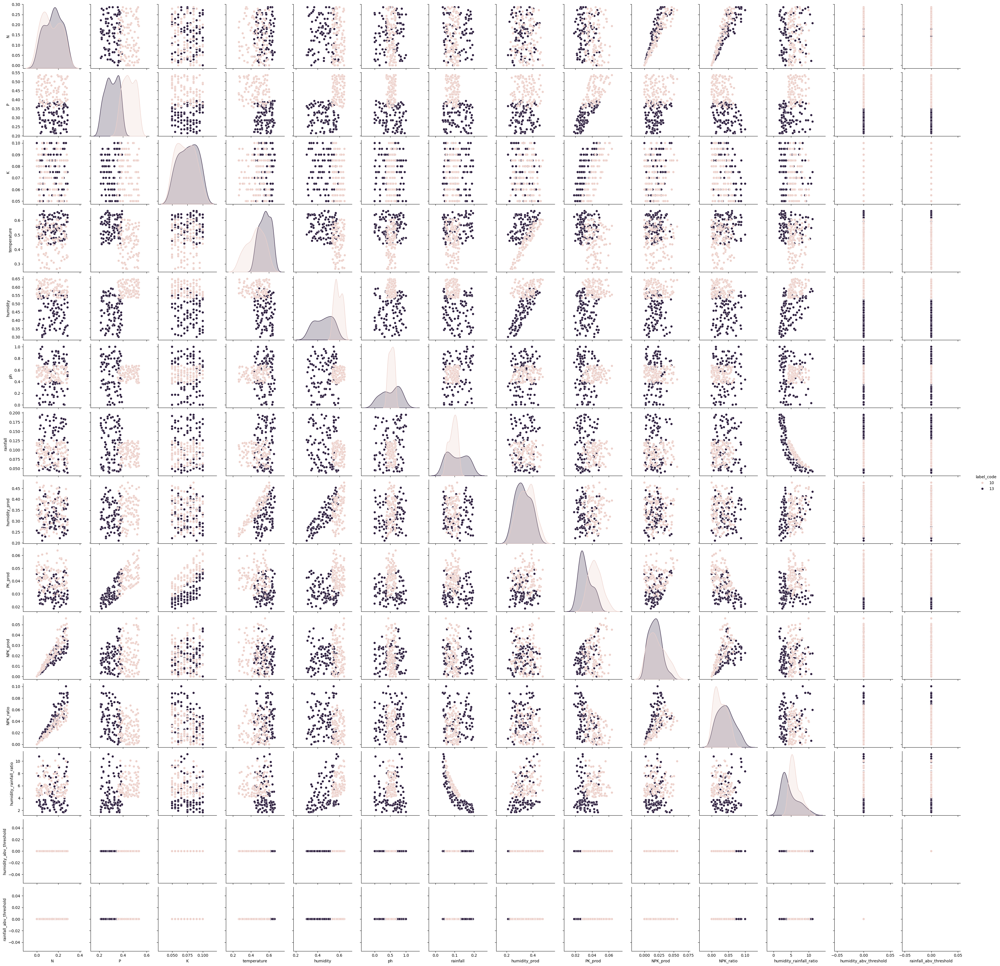

In [150]:
conflict_classes = normal[(normal["label_code"] == 13) | (normal["label_code"] == 10)]

sns.pairplot(conflict_classes, hue="label_code")

### KNN2

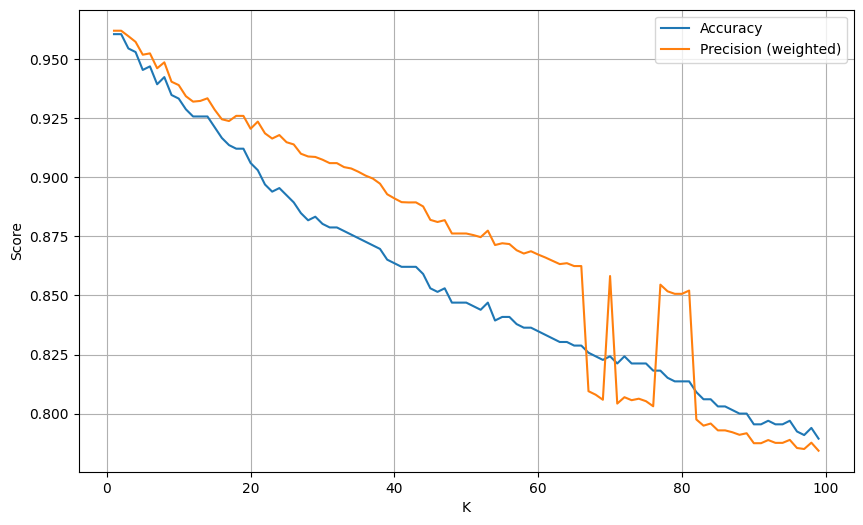

In [154]:
X_train, X_test, Y_train, Y_test = get_train_test(normal, ["label_code", "temperature", "NPK_prod", "PK_prod", "NPK_ratio"])


compare_K(X_train, X_test, Y_train, Y_test, {"weights": "distance", "algorithm": "auto", "n_jobs": 20})

In [155]:
X_train, X_test, Y_train, Y_test = get_train_test(normal, ["label_code", "temperature", "NPK_prod", "PK_prod", "NPK_ratio"])

knn2 = KNN(X_train, X_test, Y_train, Y_test)
knn2.configure_model({"n_neighbors": 5, "weights": "distance", "algorithm": "auto", "n_jobs": 20})
knn2.fit_predict_model()
knn2.show_report()

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00        26
           2       0.79      1.00      0.88        26
           3       1.00      1.00      1.00        34
           4       1.00      1.00      1.00        33
           5       1.00      1.00      1.00        30
           6       1.00      1.00      1.00        28
           7       1.00      1.00      1.00        23
           8       0.81      1.00      0.89        34
           9       1.00      1.00      1.00        36
          10       0.66      0.86      0.75        22
          11       0.96      0.92      0.94        26
          12       0.91      1.00      0.96        32
          13       0.86      0.53      0.65        34
          14       0.88      1.00      0.94        30
          15       1.00      1.00      1.00        24
          16       1.00      1.00      1.00        25
          17       1.00    